# Analisys of neighborhoods in Barcelona II

## 1. Introduction: Aim

The aim of this project is to get a better quantitative understanding of the different neighborhoods of Barcelona. In order to do so we will download some datasets that are available through the webiste of the open data platform from the Barcelona city hall and clean them, process them and analyse them.

Some of the questions we want to be able to answer are listed below:

* Do neighborhoods belonging to the same district share some characteristics? Can these be identified?

* Are there significant differences in terms of wealth (average income) between the differnt neighborhoods or districts?

* Do these differences corroborate the popular knowledge of Barcelona's wealthiest districts (Sarria, Sant Gervasi, Vallvidrera, etc.)?

* Are there differences in terms of cultural equipments between the neighborhoods? Do they correlate to other variables?

* Do we find different geographic patterns of vehicles based on the geography of the neighborhood? Do they correlate to any variable, like wealth?

* Are there any patterns in the number of animals each neighborhood has?

* Does the amount of health centers (CAPs: Primary Healthcare Center, Hospitals and Clinics) relate to de population density, wealth or other variables of each neighborhood?

* Does the distance to the sea, have any relation or effect on any socio-economic variables of the neighborhoods?


## 2. Exercies overview
Exercici 1 - 25%

    Es genera un model no supervisat.
    S'analitzen, mostren i comenten les mesures de qualitat del model generat.
    Es resumeixen les conclusions principals.

 Exercici 2 - 10%

     Es genera de nou el model no supervisat anterior, però usant una mètrica de distància diferent.
     Es mostren i es comenten les mesures de qualitat del model generat.
     Addicionalment, es comparen els dos models no supervisats amb mètriques de distància diferents.
     Es resumeixen les conclusions principals.

Exercici 3 - 10%

    S'apliquen els algorismes DBSCAN i OPTICS de forma correcta.
    Es proven, descriuen i interpreten els resultats amb diferents valors d'eps i minPts.
    S'obté una mesura de com és de bo l'agrupament.
    Es comparen els resultats obtinguts dels models dels exercicis 1 i 2.
    Es resumeixen les conclusions principals.

 Exercici 4 - 10%

    Se seleccionen les mostres d'entrenament i test.
    Es justifiquen les proporcions seleccionades.

Exercici 5 - 20%

    Es generen regles i es comenten i interpreten les més significatives.
    S'extreuen les regles del model en format text i gràfic.
    Addicionalment, es genera matriu de confusió per mesurar la capacitat predictiva de l'algoritme, tenint en compte les diferents mètriques associades a aquesta matriu (precisió, sensibilitat, especificitat...).
    Es comparen i interpreten els resultats (sense i amb opcions de poda), explicant els avantatges i els inconvenients del model generat respecte a un altre mètode de construcció.
    S'avalua la taxa d'error de l'arbre generat, l'eficiència a la classificació (a les mostres d'entrenament i test) i la comprensibilitat del resultat.
    Es resumeixen les conclusions principals.

Exercici 6 - 15%

    Es prova amb una variació o un altre enfocament algorítmic.
    Es detalla, comenta i avalua la qualitat de classificació.
    Es comparen i es comenten els resultats de manera exhaustiva amb el mètode de construcció anterior.

Exercici 7 - 10%

    S'identifica quines possibles limitacions tenen les dades que has seleccionat per obtenir conclusions amb els models (supervisat i no supervisat)
    S'identifiquen possibles riscos de fer servir el model (mínim 300 paraules).

## Data Loading

In [1]:
# Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from natsort import natsorted
import seaborn as sns

In [2]:
# Loading the previous generated dataset
df = pd.read_csv("../PR1/data/full_data_processed.csv")

In [3]:
df.head()

,codi_barri,pes_atur,mean_household_income,mean_person_income,incoming_rate_1000hab,outcoming_rate_1000hab,poblacio,densitat_neta,norm_centre_civic_count,norm_police_office_count,...,norm_hotel_count,norm_hospitals_and_clinics,norm_total_cars,norm_tourist_accomodation_count,norm_pension_count,norm_caps,norm_trees_count,mean_household_income_categorical,nom_barri,by_sea
0,1,11.475000,27036.904762,10205.238095,115.7,137.5,47129,948.2,0.000021,0.000064,...,0.001061,0.000000,0.012131,0.000170,0.000509,0.000064,0.006769,Low,el Raval,False
1,2,5.983333,30513.333333,13249.333333,109.0,119.8,15614,457.2,0.000064,0.000000,...,0.003715,0.000000,0.082298,0.000448,0.002690,0.000064,0.006469,Low,el Barri Gòtic,True
2,3,10.241667,27356.727273,13195.181818,97.0,119.4,15021,1113.2,0.000067,0.000067,...,0.000333,0.000133,0.038982,0.000133,0.000000,0.000067,0.006324,Low,la Barceloneta,True
3,4,9.066667,31032.846154,14217.384615,100.4,120.1,22306,688.7,0.000045,0.000045,...,0.001031,0.000000,0.039720,0.000134,0.000403,0.000045,0.001569,Low,Sant Pere Santa Caterina I la Ribera,True
4,5,6.083333,42808.150000,18044.050000,88.4,84.0,31653,947.7,0.000032,0.000032,...,0.000316,0.000000,0.023247,0.000095,0.000000,0.000095,0.006792,Medium,el Fort Pienc,False


## Exercise 1
    Es genera un model no supervisat.
    S'analitzen, mostren i comenten les mesures de qualitat del model generat.
    Es resumeixen les conclusions principals.

(In the first assignment we already did PCA, which is an unsupervised ML model)

In [4]:
# We create a dataframe with the features, which does not contain the neighborhood code (codi_barri)
df_features = df.drop(columns=["codi_barri", "nom_barri"])

In [5]:
# Remove categorical variables
df_features.drop(columns=["mean_household_income_categorical"], inplace=True)

In [6]:
# Remove total population, because the density is a better measure and it already contains the population 
df_features.drop(columns=["poblacio"], inplace=True)

In [7]:
df_features

,pes_atur,mean_household_income,mean_person_income,incoming_rate_1000hab,outcoming_rate_1000hab,densitat_neta,norm_centre_civic_count,norm_police_office_count,norm_pharmacy,norm_accident_count,norm_animal_per_population,norm_hotel_count,norm_hospitals_and_clinics,norm_total_cars,norm_tourist_accomodation_count,norm_pension_count,norm_caps,norm_trees_count,by_sea
0,11.475000,27036.904762,10205.238095,115.7,137.5,948.2,0.000021,0.000064,0.000700,0.002928,0.038313,0.001061,0.000000,0.012131,0.000170,0.000509,0.000064,0.006769,False
1,5.983333,30513.333333,13249.333333,109.0,119.8,457.2,0.000064,0.000000,0.001281,0.007749,0.038313,0.003715,0.000000,0.082298,0.000448,0.002690,0.000064,0.006469,True
2,10.241667,27356.727273,13195.181818,97.0,119.4,1113.2,0.000067,0.000067,0.000599,0.009054,0.038313,0.000333,0.000133,0.038982,0.000133,0.000000,0.000067,0.006324,True
3,9.066667,31032.846154,14217.384615,100.4,120.1,688.7,0.000045,0.000045,0.001076,0.004887,0.038313,0.001031,0.000000,0.039720,0.000134,0.000403,0.000045,0.001569,True
4,6.083333,42808.150000,18044.050000,88.4,84.0,947.7,0.000032,0.000032,0.000632,0.008530,0.038838,0.000316,0.000000,0.023247,0.000095,0.000000,0.000095,0.006792,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,8.375000,46815.714286,18755.714286,59.2,52.1,581.9,0.000000,0.000000,0.000523,0.007091,0.048252,0.000821,0.000000,0.065377,0.000000,0.000000,0.000075,0.049638,True
69,9.408333,29956.153846,11355.692308,79.2,76.3,887.8,0.000044,0.000000,0.000615,0.004177,0.048252,0.000044,0.000044,0.029807,0.000088,0.000000,0.000044,0.030775,True
70,7.583333,38873.583333,15427.500000,58.1,51.6,1510.9,0.000000,0.000049,0.000638,0.007168,0.048252,0.000098,0.000049,0.044332,0.000049,0.000000,0.000000,0.040994,True
71,8.891667,36274.222222,14948.166667,54.0,48.7,1148.6,0.000384,0.000384,0.006151,0.022684,0.048252,0.000000,0.000000,0.249626,0.000000,0.000000,0.000769,0.217993,False


In [8]:
# Normalize the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

features_norm = scaler.fit_transform(df_features)
features_norm

array([[ 1.48542566e+00, -1.08134873e+00, -1.37118581e+00, ...,
         3.84592810e-03, -6.94892590e-01, -3.25669474e-01],
       [-7.43013925e-01, -7.92248545e-01, -7.04918776e-01, ...,
         6.84037761e-03, -6.99295930e-01,  3.07059789e+00],
       [ 9.84956677e-01, -1.05475226e+00, -7.16771024e-01, ...,
         2.62527749e-02, -7.01409910e-01,  3.07059789e+00],
       ...,
       [-9.37568694e-02, -9.70092207e-02, -2.28179212e-01, ...,
        -4.84885794e-01, -1.92716124e-01,  3.07059789e+00],
       [ 4.37146036e-01, -3.13172381e-01, -3.33091828e-01, ...,
         5.41885311e+00,  2.40435946e+00, -3.25669474e-01],
       [ 5.96078753e-01, -4.51913808e-01, -5.69228596e-01, ...,
        -2.16852544e-01, -1.13455687e-01, -3.25669474e-01]])

In [9]:
df_features_norm = pd.DataFrame(data=features_norm, columns=scaler.feature_names_in_)
df_features_norm.head()

,pes_atur,mean_household_income,mean_person_income,incoming_rate_1000hab,outcoming_rate_1000hab,densitat_neta,norm_centre_civic_count,norm_police_office_count,norm_pharmacy,norm_accident_count,norm_animal_per_population,norm_hotel_count,norm_hospitals_and_clinics,norm_total_cars,norm_tourist_accomodation_count,norm_pension_count,norm_caps,norm_trees_count,by_sea
0,1.485426,-1.081349,-1.371186,2.631561,3.580608,0.929637,-0.335399,0.240959,-0.197159,-0.317551,-1.741282,1.558213,-0.420905,-0.187802,0.412755,1.069365,0.003846,-0.694893,-0.325669
1,-0.743014,-0.792249,-0.704919,2.251584,2.688064,-0.765328,0.117164,-0.308347,0.326251,-0.056415,-1.741282,6.568662,-0.420905,-0.120513,2.052712,6.887685,0.006840,-0.699296,3.070598
2,0.984957,-1.054752,-0.716771,1.571028,2.667893,1.499228,0.143882,0.266143,-0.288236,0.014242,-1.741282,0.183580,0.595911,-0.162052,0.197288,-0.289367,0.026253,-0.701410,3.070598
3,0.508159,-0.749046,-0.493040,1.763852,2.703192,0.033826,-0.085877,0.078518,0.141512,-0.211477,-1.741282,1.501938,-0.420905,-0.161344,0.205212,0.787177,-0.140682,-0.771185,3.070598
4,-0.702435,0.230190,0.344510,1.083296,0.882805,0.927911,-0.225771,-0.035722,-0.258770,-0.014139,-1.650277,0.151593,-0.420905,-0.177141,-0.028595,-0.289367,0.242800,-0.694544,-0.325669


In [10]:
from sklearn.cluster import KMeans

In [11]:
K = 11 # number of districts +1

sse_scores = []
for k in range(1, K):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init='auto').fit(df_features_norm)
    sse_scores.append(kmeans.inertia_)


Text(0, 0.5, 'Sum of Squared Errors')

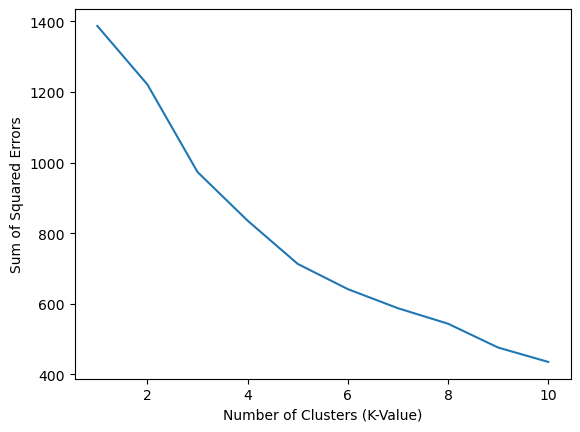

In [12]:
plt.plot(range(1,K), sse_scores)
plt.xlabel('Number of Clusters (K-Value)')
plt.ylabel('Sum of Squared Errors')

In [13]:
from sklearn.metrics import silhouette_score

In [14]:
K = 11# We could use K = 10 here too
sse_scores = []
silhouette_scores = []
for k in range(2, K):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init='auto').fit(df_features_norm)
    # sse_scores.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df_features_norm, kmeans.labels_))

Text(0, 0.5, 'Silhouette Score')

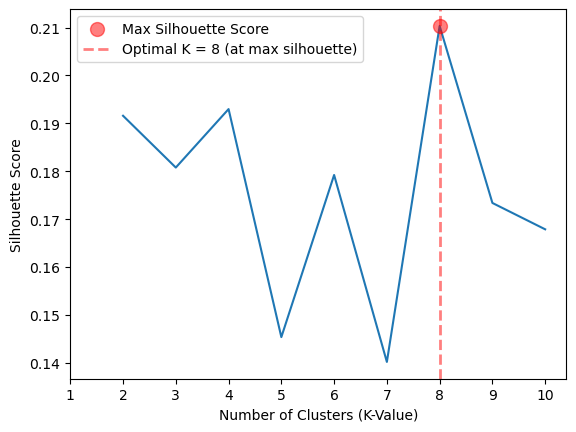

In [15]:
max_index = np.argmax(silhouette_scores)
max_value = silhouette_scores[max_index]
max_k = range(2, K)[max_index]


plt.plot(range(2,K)[0:10], silhouette_scores[0:10])
plt.scatter(max_k, max_value, color='red', s=100, zorder=5, alpha=0.5, label='Max Silhouette Score')
plt.axvline(x=max_k, color='r', linestyle='--', linewidth=2, alpha=0.5, label=f'Optimal K = {max_k} (at max silhouette)')
plt.xticks(range(1, 11), range(1, 11))
plt.legend()
plt.xlabel('Number of Clusters (K-Value)')
plt.ylabel('Silhouette Score')

According to the silouette, the best way to cluster our data is in 8 groups.

In [16]:
kmeans = KMeans(n_clusters=8, random_state=0, n_init='auto').fit(df_features_norm)

In [17]:
clusters = kmeans.predict(df_features_norm)

In [18]:
clusters

array([4, 3, 4, 4, 1, 1, 3, 1, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 6, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 4, 4, 4, 4, 5, 0], dtype=int32)

In [19]:
df["kmeans_8_clusters"]=clusters

In [20]:
df.head()

,codi_barri,pes_atur,mean_household_income,mean_person_income,incoming_rate_1000hab,outcoming_rate_1000hab,poblacio,densitat_neta,norm_centre_civic_count,norm_police_office_count,...,norm_hospitals_and_clinics,norm_total_cars,norm_tourist_accomodation_count,norm_pension_count,norm_caps,norm_trees_count,mean_household_income_categorical,nom_barri,by_sea,kmeans_8_clusters
0,1,11.475000,27036.904762,10205.238095,115.7,137.5,47129,948.2,0.000021,0.000064,...,0.000000,0.012131,0.000170,0.000509,0.000064,0.006769,Low,el Raval,False,4
1,2,5.983333,30513.333333,13249.333333,109.0,119.8,15614,457.2,0.000064,0.000000,...,0.000000,0.082298,0.000448,0.002690,0.000064,0.006469,Low,el Barri Gòtic,True,3
2,3,10.241667,27356.727273,13195.181818,97.0,119.4,15021,1113.2,0.000067,0.000067,...,0.000133,0.038982,0.000133,0.000000,0.000067,0.006324,Low,la Barceloneta,True,4
3,4,9.066667,31032.846154,14217.384615,100.4,120.1,22306,688.7,0.000045,0.000045,...,0.000000,0.039720,0.000134,0.000403,0.000045,0.001569,Low,Sant Pere Santa Caterina I la Ribera,True,4
4,5,6.083333,42808.150000,18044.050000,88.4,84.0,31653,947.7,0.000032,0.000032,...,0.000000,0.023247,0.000095,0.000000,0.000095,0.006792,Medium,el Fort Pienc,False,1


In [21]:
palette_tab10 = sns.color_palette("tab10", 10).as_hex()

In [22]:
import folium
import json

In [23]:
with open('../PR1/data/geodata/BarcelonaCiutat_Barris.json', 'r') as file:
    geo_barri = json.load(file)
with open('../PR1/data/geodata/BarcelonaCiutat_Districtes.json', 'r') as file:
    geo_districte = json.load(file)

In [24]:
bcn_map = folium.Map(location=[41.39025569873057, 2.169050489124417], zoom_start=12)

for barri in geo_barri:
    # Extract the coordinates
    coordinates = barri['geometria_wgs84']
    
    # Convert the string of coordinates into a list of tuples
    coords = coordinates.replace("POLYGON ((", "").replace("))", "").split(", ")
    coords = [(float(coord.split()[1]), float(coord.split()[0])) for coord in coords]
    
    codi_barri = int(barri["codi_barri"])
    #print(codi_barri)
    
    color = df[df["codi_barri"]==codi_barri]["kmeans_8_clusters"].iloc[0]
    #print(color)

    # Add the polygon to the map
    folium.Polygon(
        locations=coords,
        color="black",
        weight=1,
        fill=True,
        fill_color=palette_tab10[color],
        fill_opacity=0.6,
    ).add_to(bcn_map)
    
for districte in geo_districte:
    # Extract the coordinates
    coordinates = districte['geometria_wgs84']
    
    # Convert the string of coordinates into a list of tuples
    coords = coordinates.replace("POLYGON ((", "").replace("))", "").split(", ")
    coords = [(float(coord.split()[1]), float(coord.split()[0])) for coord in coords]

    # Add the polygon to the map
    folium.Polygon(
        locations=coords,
        color='black',
        weight=3,
        fill=False,
        popup=districte["nom_districte"]
    ).add_to(bcn_map)

    
#Title
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format("8 K Means clusters based on all features")   
bcn_map.get_root().html.add_child(folium.Element(title_html))

bcn_map 

In our dataset every neighborhood belongs to a district, but this belonging is somewhat arbitrary and it does not reflect a real category of the neighborhood. It is different from a classification task where all the items do really belong to a class because they share some characteristics. In the previous exercise we divided the neighborhood based on their income into 4 categories: Low, Medium, High and Very High. Let's see if we can find these as clusters of the other features using Kmeans.

### Predicting income levels based on the rest of features

In [25]:
df['mean_household_income_categorical'] = pd.Categorical(df['mean_household_income_categorical'])

In [26]:

df['mean_household_income_cat_numerical']=df['mean_household_income_categorical'].cat.codes

Aquest es el mapa que mostra per colors els barris de barcelona segons la classificacio que vam fer:

In [27]:
def plot_map(legend_col, title):
    bcn_map = folium.Map(location=[41.39025569873057, 2.169050489124417], zoom_start=12)

    for barri in geo_barri:
        # Extract the coordinates
        coordinates = barri['geometria_wgs84']

        # Convert the string of coordinates into a list of tuples
        coords = coordinates.replace("POLYGON ((", "").replace("))", "").split(", ")
        coords = [(float(coord.split()[1]), float(coord.split()[0])) for coord in coords]

        codi_barri = int(barri["codi_barri"])


        #color = df[df["codi_barri"]==codi_barri][color_col].iloc[0]
        color_dict = {"Very High" : sns.color_palette("tab10", 10).as_hex()[0],
                      "High" : sns.color_palette("tab10", 10).as_hex()[2],
                      "Medium" : sns.color_palette("tab10", 10).as_hex()[1],
                      "Low" : sns.color_palette("tab10", 10).as_hex()[3]
                     }
        
        
        cat_income = df[df["codi_barri"]==codi_barri][legend_col].iloc[0]
        color = color_dict[cat_income]

        nom_barri = barri["nom_barri"]

        mean_income = int(df[df["codi_barri"] == codi_barri]["mean_household_income"].mean())

        popup_message = f"{nom_barri}\nMean household income: {mean_income} €.\n Income level: {cat_income}"

        # Add the polygon to the map
        folium.Polygon(
            locations=coords,
            color="black",
            weight=1,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=popup_message
        ).add_to(bcn_map)

    for districte in geo_districte:
        # Extract the coordinates
        coordinates = districte['geometria_wgs84']

        # Convert the string of coordinates into a list of tuples
        coords = coordinates.replace("POLYGON ((", "").replace("))", "").split(", ")
        coords = [(float(coord.split()[1]), float(coord.split()[0])) for coord in coords]

        # Add the polygon to the map
        folium.Polygon(
            locations=coords,
            color='black',
            weight=3,
            fill=False,
            popup=districte["nom_districte"]
        ).add_to(bcn_map)

    #Title
    title_html = '''
                 <h3 align="center" style="font-size:16px"><b>{}</b></h3>
                 '''.format(title)
    
    bcn_map.get_root().html.add_child(folium.Element(title_html))

    return bcn_map 

In [28]:
ground_truth_map = plot_map("mean_household_income_categorical", "Ground Truth Categorical Income")
ground_truth_map

In [29]:
df.groupby('mean_household_income_cat_numerical')['mean_household_income'].mean().sort_values(ascending=False)

mean_household_income_cat_numerical
3    69902.014321
0    48902.992169
2    38910.344274
1    29534.559151
Name: mean_household_income, dtype: float64

In [30]:
df.groupby('mean_household_income_cat_numerical')['mean_household_income'].std().sort_values(ascending=False)

mean_household_income_cat_numerical
3    7316.391092
1    2900.119994
0    2632.068228
2    2191.510736
Name: mean_household_income, dtype: float64

In [31]:
# We drop the feature columns that actually contain information about income

In [32]:
df_features_norm.drop(columns=['mean_household_income', 'mean_person_income'], inplace=True)

In [33]:
df_features_norm.columns

Index(['pes_atur', 'incoming_rate_1000hab', 'outcoming_rate_1000hab',
       'densitat_neta', 'norm_centre_civic_count', 'norm_police_office_count',
       'norm_pharmacy', 'norm_accident_count', 'norm_animal_per_population',
       'norm_hotel_count', 'norm_hospitals_and_clinics', 'norm_total_cars',
       'norm_tourist_accomodation_count', 'norm_pension_count', 'norm_caps',
       'norm_trees_count', 'by_sea'],
      dtype='object')

In [34]:
kmeans = KMeans(n_clusters=4, random_state=0, n_init='auto').fit(df_features_norm)
clusters = kmeans.predict(df_features_norm)

In [35]:
df["kmeans_income_4_clusters_numerical"]=clusters

As we see, with K-means and using the features that do not contain information about the income we get another classification of the neighborhoods. We will calculate some metrics of this classification:

Mean income per group:

The cluster labels, are just numbers so we need to link every cluster to a category "Low", "Medium", "High", and "Very High", or the equivalent 'mean_household_income_cat_numerical'

In [36]:
df["kmeans_income_4_clusters"] = df["kmeans_income_4_clusters_numerical"].replace({3 : "Very High", 0 : "High", 1: "Medium", 2: "Low"})

In [37]:
kmeans_mean = df.groupby("kmeans_income_4_clusters")['mean_household_income'].mean().sort_values(ascending=False)
kmeans_mean 

kmeans_income_4_clusters
Very High    41145.080460
High         40680.543585
Medium       31946.908921
Low          27935.000000
Name: mean_household_income, dtype: float64

In [38]:
mean_categorical = df.groupby("mean_household_income_categorical")['mean_household_income'].mean().sort_values(ascending=False)
mean_categorical

mean_household_income_categorical
Very High    69902.014321
High         48902.992169
Medium       38910.344274
Low          29534.559151
Name: mean_household_income, dtype: float64

In [39]:
plot_map("kmeans_income_4_clusters", "4 Clusters with KMeans")

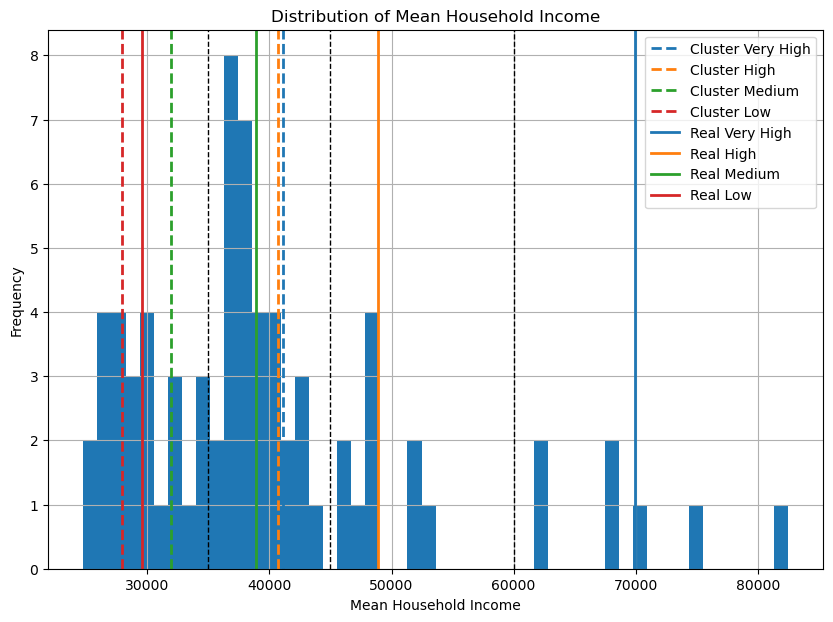

In [40]:
# Let's compare this to the groups we had done:
bins = [-np.inf, 35000, 45000, 60000, np.inf]

df["mean_household_income"].hist(bins=50, figsize=(10, 7))
plt.title('Distribution of Mean Household Income')
plt.xlabel('Mean Household Income')
plt.ylabel('Frequency')
for value in bins[1:-1]:
    plt.axvline(x=value, color='black', linestyle='--', linewidth=1)

colors = plt.cm.tab10.colors  # You can choose any colormap
plt.gca().set_prop_cycle(color=colors)

for i, (label, value) in enumerate(kmeans_mean.items()):
    plt.axvline(x=value, color=colors[i], linestyle='--', linewidth=2, label=f"Cluster {label}")

for i, (label, value) in enumerate(mean_categorical.items()):
    plt.axvline(x=value, color=colors[i], linewidth=2, label=f"Real {label}")


plt.legend()
plt.show()

This graph is quite dense, but basically is the visual depiction of what we saw while comparing the grouped means. The Kmeans cluster seems to cluster neighborhoods more into groups that when we look at its income fit more into: Very Low, Low, Medium and Medium. The neighborhoods that we discretized into High and Very High belong to the same group as the Medium ones, as we saw in the map. This answers one of the questions we had: it seems that apart from the income of its citizens, most of Barcelona neighbours fall into the same cluster. So there seems not to be a big difference in terms of the other features we are analyzing.

Having said this, a further more detailed analyzis would look at the neighborhood of Marina del Port Vermell, which seems to be an outlier. From what we know about this neighborhood, which was a Portuary zone until very recently, it makes sense to discard it. Also 

In [41]:
from sklearn.metrics import accuracy_score

accuracy_score(df['mean_household_income_categorical'], df['kmeans_income_4_clusters'])

0.1643835616438356

Our model was able to predict the categorical income level of the neighborhoods based on the rest of the features with a very low accuracy.

## Exercici 2
 Es genera de nou el model no supervisat anterior, però usant una mètrica de distància diferent.
 Es mostren i es comenten les mesures de qualitat del model generat.
 Addicionalment, es comparen els dos models no supervisats amb mètriques de distància diferents.
 Es resumeixen les conclusions principals.



Now we will use another unsupervised model which used another metric of distance.

In [42]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [43]:
df_features_norm.columns

Index(['pes_atur', 'incoming_rate_1000hab', 'outcoming_rate_1000hab',
       'densitat_neta', 'norm_centre_civic_count', 'norm_police_office_count',
       'norm_pharmacy', 'norm_accident_count', 'norm_animal_per_population',
       'norm_hotel_count', 'norm_hospitals_and_clinics', 'norm_total_cars',
       'norm_tourist_accomodation_count', 'norm_pension_count', 'norm_caps',
       'norm_trees_count', 'by_sea'],
      dtype='object')

In [44]:
linked = linkage(df_features_norm, method='ward')
# first splt
split = linked[-4, 2]

clusters = fcluster(linked, t=split, criterion="distance")

In [45]:
clusters

array([3, 1, 3, 3, 3, 3, 1, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 2, 3, 3, 3,
       3, 3, 3, 3, 3, 2, 3], dtype=int32)

In [46]:
np.unique(clusters)

array([1, 2, 3, 4], dtype=int32)

Text(0.5, 1.0, 'Dendrogram')

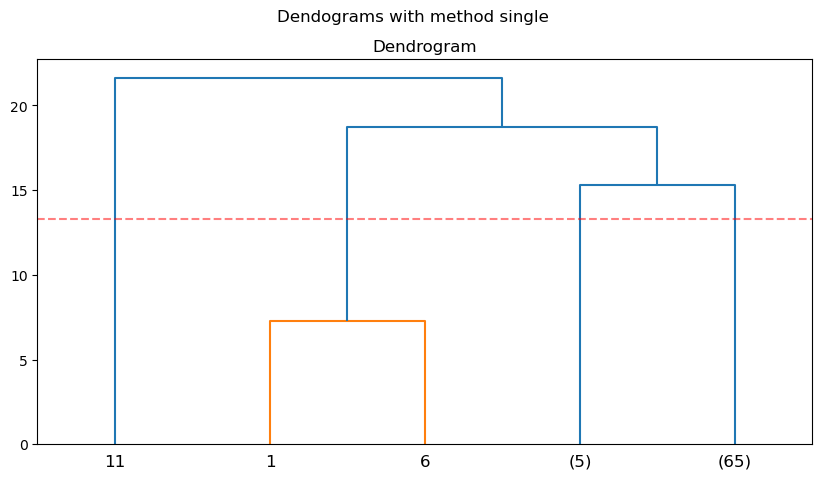

In [47]:
fig, axes = plt.subplots(figsize=(10, 5))
plt.suptitle(f"Dendograms with method single")
dend = dendrogram(linked, truncate_mode="level", p=2, ax=axes)
axes.axhline(y=split, color="r", linestyle="--", alpha=.5)
axes.set_title("Dendrogram")

In [48]:
df["dendogram_income_4_branches_numerical"]=clusters

In [49]:
df.groupby('dendogram_income_4_branches_numerical')['mean_household_income'].mean().sort_values(ascending=False)

dendogram_income_4_branches_numerical
1    41145.080460
3    40747.425025
2    32824.177137
4    27935.000000
Name: mean_household_income, dtype: float64

In [50]:
df["dendogram_income_4_branches"] = df["dendogram_income_4_branches_numerical"].replace({1 : "Very High", 3 : "High", 2: "Medium", 4: "Low"})

In [51]:
df.groupby('dendogram_income_4_branches')['mean_household_income'].mean().sort_values(ascending=False)

dendogram_income_4_branches
Very High    41145.080460
High         40747.425025
Medium       32824.177137
Low          27935.000000
Name: mean_household_income, dtype: float64

In [52]:
df.groupby('mean_household_income_categorical')['mean_household_income'].mean().sort_values(ascending=False)

mean_household_income_categorical
Very High    69902.014321
High         48902.992169
Medium       38910.344274
Low          29534.559151
Name: mean_household_income, dtype: float64

In [53]:
plot_map("dendogram_income_4_branches", "Dendrogram 4 Clusters")

In [54]:
dendogram_mean = df.groupby("dendogram_income_4_branches")['mean_household_income'].mean().sort_values(ascending=False)
dendogram_mean

dendogram_income_4_branches
Very High    41145.080460
High         40747.425025
Medium       32824.177137
Low          27935.000000
Name: mean_household_income, dtype: float64

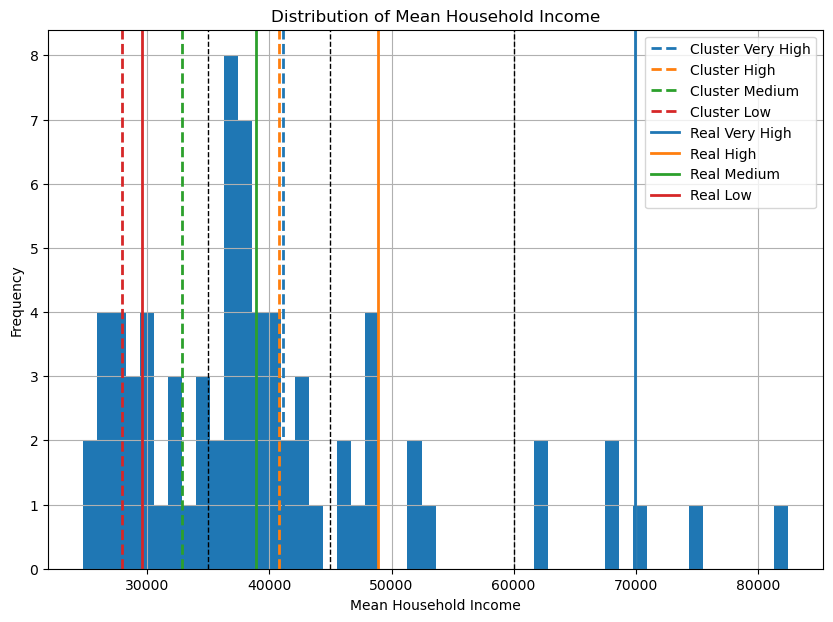

In [55]:
# Let's compare this to the groups we had done:
bins = [-np.inf, 35000, 45000, 60000, np.inf]

df["mean_household_income"].hist(bins=50, figsize=(10, 7))
plt.title('Distribution of Mean Household Income')
plt.xlabel('Mean Household Income')
plt.ylabel('Frequency')
for value in bins[1:-1]:
    plt.axvline(x=value, color='black', linestyle='--', linewidth=1)

colors = plt.cm.tab10.colors  # You can choose any colormap
plt.gca().set_prop_cycle(color=colors)

for i, (label, value) in enumerate(dendogram_mean.items()):
    plt.axvline(x=value, color=colors[i], linestyle='--', linewidth=2, label=f"Cluster {label}")

for i, (label, value) in enumerate(mean_categorical.items()):
    plt.axvline(x=value, color=colors[i], linewidth=2, label=f"Real {label}")


plt.legend()
plt.show()

In [56]:
accuracy_score(df['mean_household_income_categorical'], df['dendogram_income_4_branches'])

0.1780821917808219

As we see the dendrogram has even a bit higher score for predicting the income classes. In the dendrogram clustering we see that when taking the income variables outside of features, the dendrogram can identify 4 clusters, 3 of them with very few neighborhoods. These neighborhoods are El Gotic i la Dreta de l'Eixample in the Very High income group. Sant Marti de Provençals, Navas, Montbau, Verdun and Baro de Viver in the medium group. La Marina del Prat vermell in the low group, and all the rest in the High income group. The rest of the neighborhoods belong to one single cluster. This again hints into the direction that Barcelona neighborhoods are not so different to each other, if we do not consider the income of their inhabitants. According to this, the majority of the neighborhoods belong to the same class which has a High salary on average.

In the Kmeans we used the euclidean distance to calculate the groups. For the dendrogram we used the Ward Linkage method, which tries to minimize the distance between clusters. We obtained similar results.

Not shown is the accuracy_score obtained with the dendrogram but using the simple method, which uses the minimum distance between points in two clusters, and gave a veery low score of 0.10.


### General conclusions:
From the first part we can conclude that if we were to cluster the 73 neighborhoods of Barcelona in 8 districts based on similarity, the groups would be very different than the current ones.

Secondly, we have observed that the neighborhood of La Marina del Prat Vermell is clearly a neighborhood that needs its own cluster regardless of the method. (It had also the highest PC1 weight in the PCA). Indeed from the information we could gather about this neighborhood our results make sense. The neighborhood was a industrial area not much populated until 2015. As a matter of fact, it is important to notice that the neighborhood has a very low population still nowadays. Since many of our features are normalized by population, this increases the differences of this neighborhood to the rest, because many features take into account low density.

Finally, we have seen that when we take the income features outside of our clustering algorithms, most of Barcelona neighborhoods cluster together. This is a positive indicator that there are not big differences in terms of services depending on the wealth of its residents. Nevertheless, the features we added to our dataset were not meant to be a representation of services that a neighborhood should have, but more a list of features that we found interesting and that were accessible throught the city hall website.

In [57]:
df.groupby("nom_barri")["poblacio"].mean().sort_values()

nom_barri
la Clota                            583.0
la Marina del Prat Vermell         1143.0
Verdun                             1226.0
Vallbona                           1352.0
Navas                              2208.0
                                   ...   
el Raval                          47129.0
la Vila de Gràcia                 50584.0
la Sagrada Família                51322.0
Sant Andreu                       56683.0
la Nova Esquerra de l'Eixample    57648.0
Name: poblacio, Length: 73, dtype: float64

In [58]:
df.groupby("nom_barri")["densitat_neta"].mean().sort_values()

nom_barri
la Marina del Prat Vermell                31.8
Vallvidrera el Tibidabo I les Planes      51.8
la Clota                                  95.2
Torre Baró                               131.7
Pedralbes                                144.1
                                         ...  
la Barceloneta                          1113.2
el Clot                                 1139.0
el Turó de la Peira                     1143.9
Sant Martí de Provençals                1148.6
Provençals del Poblenou                 1510.9
Name: densitat_neta, Length: 73, dtype: float64

## Exercise 3

3.1 S’apliquen els algorismes DBSCAN i OPTICS de forma correcta.

3.2 Es proven, descriuen i interpreten els resultats amb diferents valors d’eps i minPts.

3.3 S’obté una mesura de com és de bo l’agrupament.

3.4 Es comparen els resultats obtinguts dels models anteriors i DBSCAN.

3.5 Es comenten les conclusions.


In [59]:
def process_clusters(clusters):
    """
    Process clusters so they can be used fo the accuracy_score 
    """
    income_list = ["Very High", "High", "Medium", "Low"]
    df["new_clusters"] = clusters
    df["new_cluster_cat"]=clusters
    clusters_mean = df.groupby("new_clusters")["mean_household_income"].mean().sort_values(ascending=False)
    
    # Replace cluster labels with income categories
    cluster_to_income = {label: income_list[i] for i, label in enumerate(clusters_mean.index)}
    df["new_cluster_cat"] = df["new_cluster_cat"].replace(cluster_to_income)
    
    return df["new_cluster_cat"]
                   

### DBSCAN

In [60]:
from sklearn.cluster import DBSCAN

In [61]:
eps_values = np.linspace(2, 4, 10)
min_samples_values = np.linspace(2, 25, 5, dtype=int)

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)

        clustering = dbscan.fit(df_features_norm)
        labels = clustering.labels_
        unique_clusters = len(np.unique(labels))
        if unique_clusters >= 4:
            print(f"Eps: {eps}, min_values: {min_samples}")
            print(f"Found {len(np.unique(labels))} unique clusters")
            if unique_clusters == 4:
                new_labels = process_clusters(labels)
                acc_score = accuracy_score(df['mean_household_income_categorical'], new_labels)
                print(f"The accuracy score of this clustering is {acc_score}\n")

Eps: 2.0, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1917808219178082

Eps: 2.6666666666666665, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1917808219178082

Eps: 2.888888888888889, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1917808219178082

Eps: 3.111111111111111, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1780821917808219



In [62]:
eps = 2
min_samples = 2
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
clustering = dbscan.fit(df_features_norm)
labels = clustering.labels_
new_labels = process_clusters(labels)


In [63]:
df["DBSCAN_4_clusters"]=new_labels
df["DBSCAN_4_clusters_numerical"] = labels

In [64]:
plot_map("DBSCAN_4_clusters", "DBSCAN 4 clusters")

### OPTICS

In [65]:
from sklearn.cluster import OPTICS
import warnings
warnings.filterwarnings("ignore")

In [66]:
eps_values = np.linspace(0.001, 1, 50)
min_samples_values = np.linspace(2, 25, 5, dtype=int)

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        
        optics = OPTICS(min_samples=min_samples, max_eps=eps)

        clustering = optics.fit(df_features_norm)
        labels = clustering.labels_
        unique_clusters = len(np.unique(labels))
        if unique_clusters >= 4:
            print(f"Eps: {eps}, min_values: {min_samples}")
            print(f"Found {len(np.unique(labels))} unique clusters")
            if unique_clusters == 4:
                new_labels = process_clusters(labels)
                acc_score = accuracy_score(df['mean_household_income_categorical'], new_labels)
                print(f"The accuracy score of this clustering is {acc_score}\n")

Eps: 0.7961224489795918, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1780821917808219

Eps: 0.8165102040816327, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1780821917808219

Eps: 0.8368979591836735, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1780821917808219

Eps: 0.8572857142857143, min_values: 2
Found 4 unique clusters
The accuracy score of this clustering is 0.1917808219178082

Eps: 0.8776734693877551, min_values: 2
Found 5 unique clusters
Eps: 0.898061224489796, min_values: 2
Found 6 unique clusters
Eps: 0.9184489795918368, min_values: 2
Found 6 unique clusters
Eps: 0.9388367346938776, min_values: 2
Found 6 unique clusters
Eps: 0.9592244897959185, min_values: 2
Found 6 unique clusters
Eps: 0.9796122448979593, min_values: 2
Found 6 unique clusters
Eps: 1.0, min_values: 2
Found 6 unique clusters


In [67]:
eps = 0.8572857142857143
min_samples = 2
optics = OPTICS(min_samples=min_samples, max_eps=eps)
clustering = optics.fit(df_features_norm)
labels = clustering.labels_
new_labels = process_clusters(labels)

In [68]:
df["OPTICS_4_clusters"]=new_labels
df["OPTICS_4_clusters_numerical"] = labels

In [69]:
plot_map("OPTICS_4_clusters", "OPTICS 4 Clusters")

### Results:
In this part we have used two non supervised classification algorithms, DBSCAN and OPTICS. We want to find the number of clusters for our dataset of normalised features (excluding income related features). We have tried the differnt models with different parameters of min_samples_values and eps/max eps. We have seen that different combinations of these parameters the algorithm returns more or less clusters. In our case we wanted to identify 4 clusters, which correspond to the categorical income levels, categorized as "Very High", "High", "Medium", "Low". When we tested the accuracy of DBSCAN or OPTICS we found and improvement over the previous methods with the best parameters, which were eps: 2.0, min_values: 2 for DBSCAN, and Eps: 0.857, min_values: 2 for OPTICS.

These two methods produced results that are not very straitghforward to interpret. Their accuracy_score is indeed better, but they do not provide very insighftul information about the data. It seems they were able to identify the poorest neighborhoods, and the majority of the other neigborhoods were clustered in one cluster, as we have seen with the other methods. In summary they also seem to align with the idea that most neighborhoods are quite the same. Interestingly, none of these methods put La Marina del Prat vermell in its own cluster.

## Exercise 4

    Se seleccionen les mostres d'entrenament i test.
    Es justifiquen les proporcions seleccionades.


In [70]:
from sklearn.model_selection import train_test_split

In [71]:
df.columns

Index(['codi_barri', 'pes_atur', 'mean_household_income', 'mean_person_income',
       'incoming_rate_1000hab', 'outcoming_rate_1000hab', 'poblacio',
       'densitat_neta', 'norm_centre_civic_count', 'norm_police_office_count',
       'norm_pharmacy', 'norm_accident_count', 'norm_animal_per_population',
       'norm_hotel_count', 'norm_hospitals_and_clinics', 'norm_total_cars',
       'norm_tourist_accomodation_count', 'norm_pension_count', 'norm_caps',
       'norm_trees_count', 'mean_household_income_categorical', 'nom_barri',
       'by_sea', 'kmeans_8_clusters', 'mean_household_income_cat_numerical',
       'kmeans_income_4_clusters_numerical', 'kmeans_income_4_clusters',
       'dendogram_income_4_branches_numerical', 'dendogram_income_4_branches',
       'new_clusters', 'new_cluster_cat', 'DBSCAN_4_clusters',
       'DBSCAN_4_clusters_numerical', 'OPTICS_4_clusters',
       'OPTICS_4_clusters_numerical'],
      dtype='object')

In [72]:
X_train, X_test, y_train, y_test = train_test_split(df_features_norm, df['mean_household_income_categorical'], test_size=.3, random_state = 42)

In [73]:
X_train.head()

,pes_atur,incoming_rate_1000hab,outcoming_rate_1000hab,densitat_neta,norm_centre_civic_count,norm_police_office_count,norm_pharmacy,norm_accident_count,norm_animal_per_population,norm_hotel_count,norm_hospitals_and_clinics,norm_total_cars,norm_tourist_accomodation_count,norm_pension_count,norm_caps,norm_trees_count,by_sea
35,0.579171,-0.686150,-1.235097,-1.521676,-0.559620,-0.308347,-0.252960,-0.286001,-0.207774,-0.444907,-0.420905,-0.112282,0.039726,-0.289367,-0.484886,-0.675577,-0.325669
44,-0.002455,0.124846,0.282732,0.063513,-0.128636,-0.308347,-0.240109,-0.310471,1.030287,-0.367902,-0.420905,-0.177972,-0.586559,-0.180547,-0.484886,-0.342995,-0.325669
61,-0.360899,0.034105,-0.186232,0.175015,0.192823,-0.308347,-0.186485,-0.275601,1.747097,-0.444907,-0.420905,-0.153647,-0.586559,-0.289367,-0.484886,-0.566447,-0.325669
7,-0.983104,0.527509,1.155106,-0.185381,-0.559620,-0.308347,0.011598,0.142427,-1.650277,0.818218,0.126483,-0.178943,0.960674,1.368109,-0.301443,-0.737065,-0.325669
56,2.428877,0.028434,0.186922,0.384556,0.493739,-0.308347,-0.109510,-0.033429,1.747097,-0.444907,-0.420905,-0.120763,-0.586559,-0.289367,0.280446,1.383602,-0.325669


In [74]:
y_train.head()

35      High
44       Low
61    Medium
7       High
56       Low
Name: mean_household_income_categorical, dtype: category
Categories (4, object): ['High', 'Low', 'Medium', 'Very High']

### Comments:
We have split the data into train and test, leaving 20% of the data for test. For this case having 20% of the data to test the accuracy of our models is good enough. Our dataset is rather small, so 20% of the data will correspond to 14-15 neighborhoods.

## Exercise 5

    Es generen regles i es comenten i interpreten les més significatives.
    S'extreuen les regles del model en format text i gràfic.
    Addicionalment, es genera matriu de confusió per mesurar la capacitat predictiva de l'algoritme, tenint en compte les diferents mètriques associades a aquesta matriu (precisió, sensibilitat, especificitat...).
    Es comparen i interpreten els resultats (sense i amb opcions de poda), explicant els avantatges i els inconvenients del model generat respecte a un altre mètode de construcció.
    S'avalua la taxa d'error de l'arbre generat, l'eficiència a la classificació (a les mostres d'entrenament i test) i la comprensibilitat del resultat.
    Es resumeixen les conclusions principals.


In [75]:
from sklearn.tree import DecisionTreeClassifier

In [76]:
from sklearn.metrics import accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [77]:
model = DecisionTreeClassifier()

model.fit(X_train, y_train)


DecisionTreeClassifier()

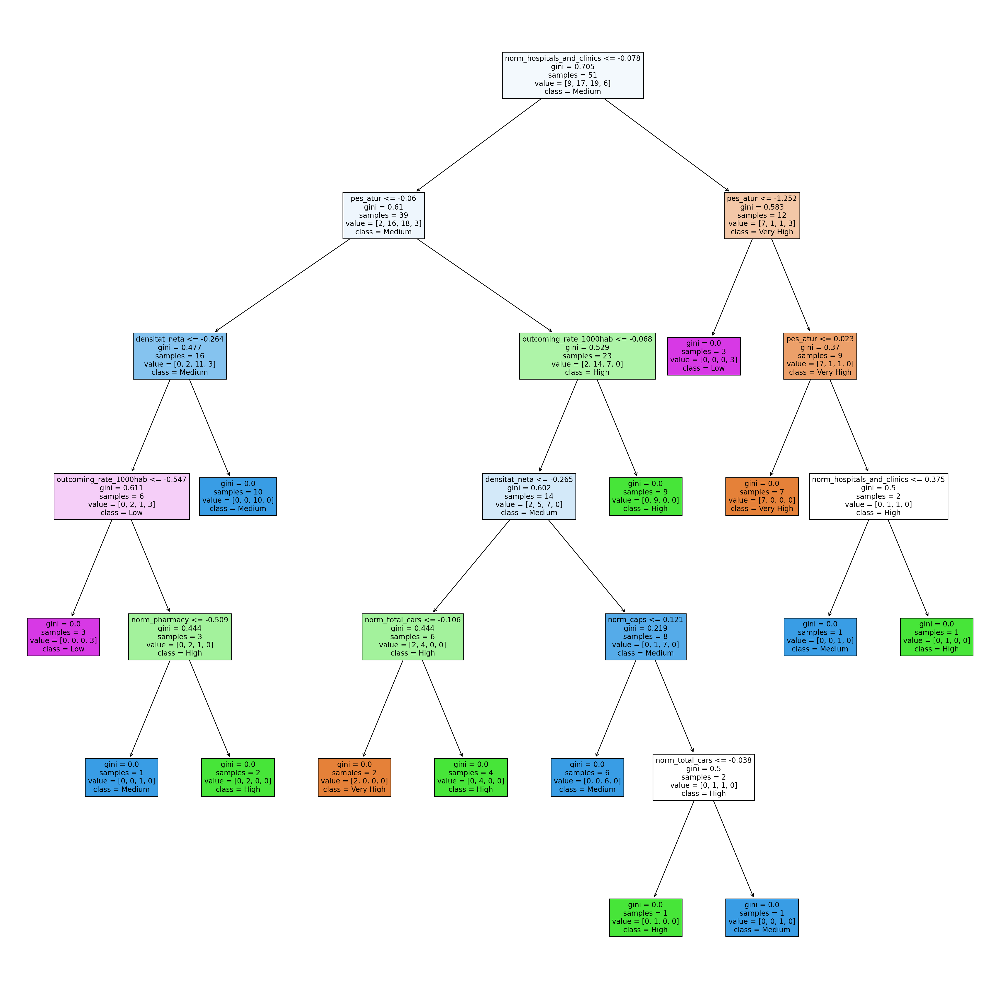

In [78]:
from sklearn.tree import plot_tree

fig, ax = plt.subplots(figsize=(25,25), dpi=200)
plot_tree(model, filled=True, feature_names=df_features_norm.columns, class_names = ["Very High", "High", "Medium", "Low"], fontsize=10, ax=ax)
plt.show()

With this plot we can see which features and which values decide on which income level the neighborhoods will go. One advantadge of decision trees is that they do not need the data to be normalised. Here we did it for simplicity, but it is true that it makes it more difficult to interpret the decision trees.

In [79]:
train_score = model.score(X_train, y_train)
test_score = model.score(X_test, y_test)
y_pred = model.predict(X_test)

In [80]:
test_score

0.5909090909090909

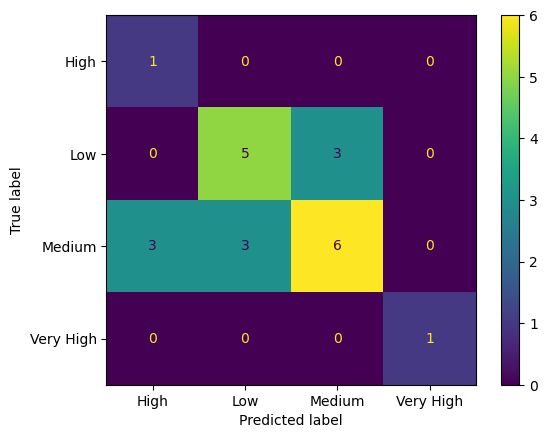

In [81]:
cm=confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

We normalize the Confusion Matrix:

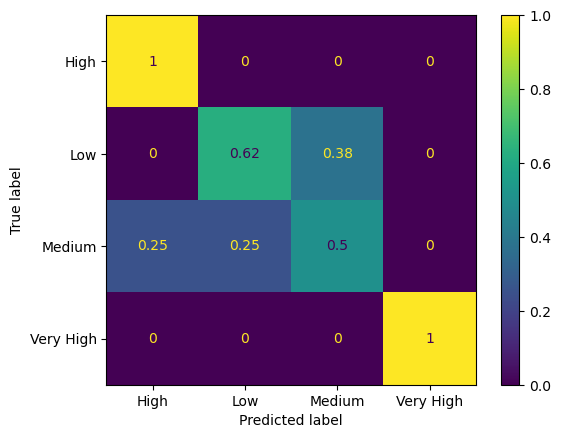

In [82]:
cm=confusion_matrix(y_test, y_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

We check it on our full dataset:

In [83]:
all_pred = model.predict(df_features_norm)

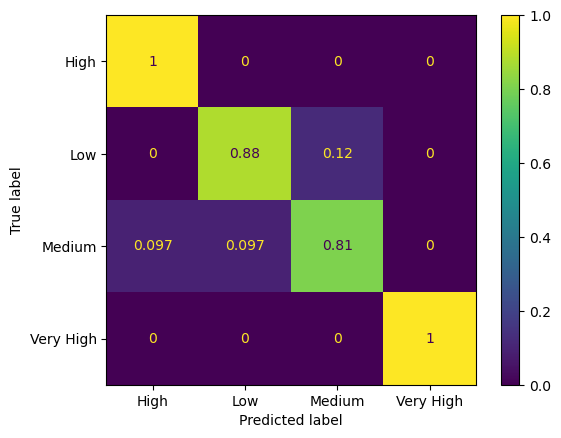

In [84]:
cm=confusion_matrix(df["mean_household_income_categorical"], all_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

Metriques en el test dataset:

In [85]:
accuracy_score(y_test, y_pred)

0.5909090909090909

In [86]:
precision_score(y_test, y_pred, labels=model.classes_, average="weighted")

0.6477272727272727

In [87]:
f1_score(y_test, y_pred, labels=model.classes_, average="weighted")

0.6025974025974027

Metriques en el dataset complet:


In [88]:
accuracy_score(df["mean_household_income_categorical"], all_pred)

0.8767123287671232

In [89]:
precision_score(df["mean_household_income_categorical"], all_pred, labels=model.classes_, average="weighted")

0.8817928646695771

In [90]:
f1_score(df["mean_household_income_categorical"], all_pred, labels=model.classes_, average="weighted")


0.8762580632135755

WE check if we can prune the tree:

In [91]:
path = model.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

# Iterate over the range of ccp_alphas to find the best alpha
trees = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    trees.append(clf)

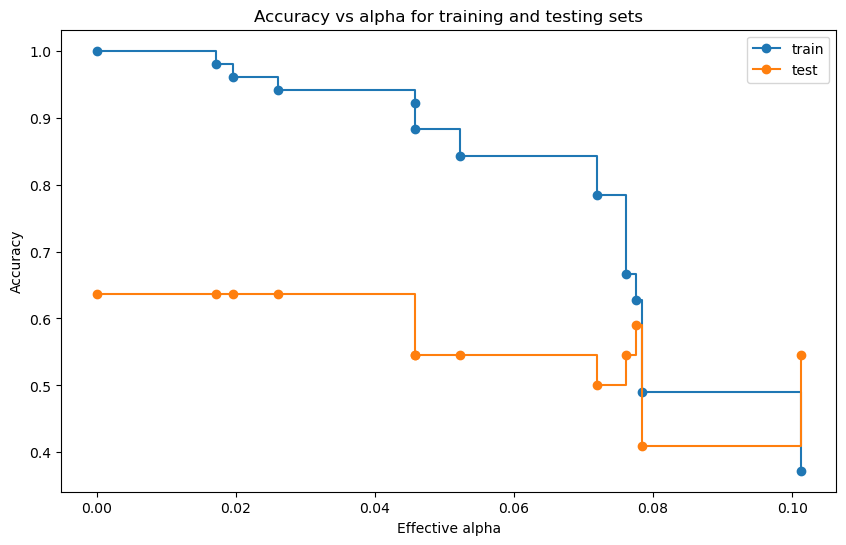

In [92]:
# Evaluate the accuracy of each pruned tree
train_scores = [clf.score(X_train, y_train) for clf in trees]
test_scores = [clf.score(X_test, y_test) for clf in trees]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(ccp_alphas, train_scores, marker='o', label='train', drawstyle="steps-post")
plt.plot(ccp_alphas, test_scores, marker='o', label='test', drawstyle="steps-post")
plt.xlabel('Effective alpha')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy vs alpha for training and testing sets')
plt.show()

# Choose the best alpha based on the test scores and retrain the tree
best_alpha = ccp_alphas[test_scores.index(max(test_scores))]
pruned_tree = DecisionTreeClassifier(random_state=42, ccp_alpha=best_alpha)
pruned_tree.fit(X_train, y_train)

# Predict on the test set
y_pred = pruned_tree.predict(X_test)

In [93]:
# Calculate metrics for prunned tree
accuracy = accuracy_score(y_test, y_pred)
print(f'Pruned Tree Test Accuracy: {accuracy}')

Pruned Tree Test Accuracy: 0.6363636363636364


In [94]:
precision_score(y_test, y_pred, labels=model.classes_, average="weighted")

0.6983766233766233

In [95]:
f1_score(y_test, y_pred, labels=model.classes_, average="weighted")

0.653168044077135

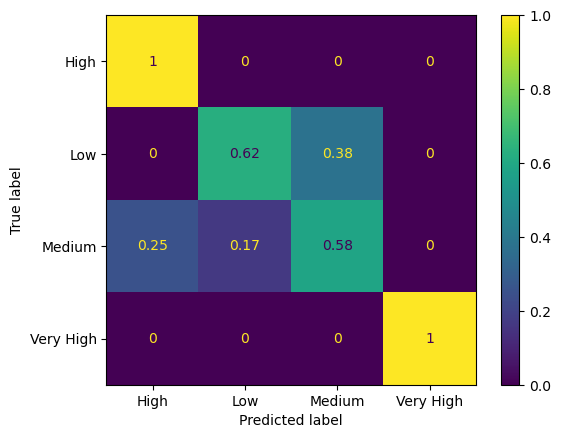

In [96]:
cm=confusion_matrix(y_test, y_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

We generate the visualization for all the predictions:

In [97]:
all_pred = pruned_tree.predict(df_features_norm)

In [98]:
df['decision_tree_clusters'] = all_pred

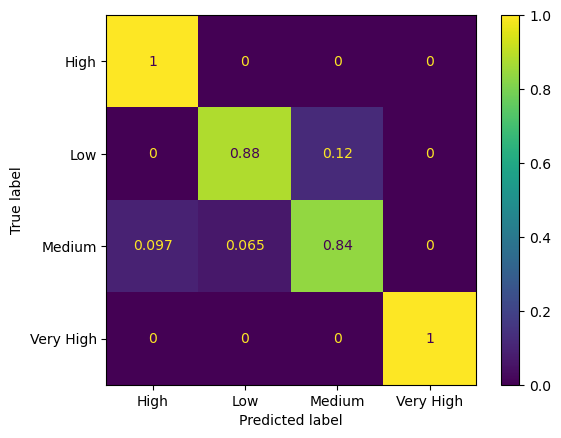

In [99]:
cm=confusion_matrix(df["mean_household_income_categorical"], all_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [100]:
df['decision_tree_clusters'] = pd.Categorical(df['decision_tree_clusters'])

In [101]:
df['mean_household_income_categorical']

0        Low
1        Low
2        Low
3        Low
4     Medium
       ...  
68      High
69       Low
70    Medium
71    Medium
72       Low
Name: mean_household_income_categorical, Length: 73, dtype: category
Categories (4, object): ['High', 'Low', 'Medium', 'Very High']

In [102]:
df['mean_household_income_categorical_num'] = df['mean_household_income_categorical'].cat.codes
df['decision_tree_clusters_num'] = df['decision_tree_clusters'].cat.codes

In [103]:
# Since they look very similar on the map, we verify that they are not the same
are_columns_same = df['decision_tree_clusters'].equals(df['mean_household_income_categorical'])

print("Are the columns the same?:", are_columns_same)

Are the columns the same?: False


In [104]:
tree_map = plot_map("decision_tree_clusters", title="Decision Tree Clusters (includes training data)")
tree_map

Ground truth looked very similar:

In [105]:
ground_truth_map

### Results:
With supervised models like the decision tree we have improved significantly our accuracy. Decision trees have acquired a relatively good score at prediction the neighborhood categorical wealth using 70 percent of the data for training, and evaluating on the remaining 30%.

## Exercise 6
    Es prova amb una variació o un altre enfocament algorítmic.
    Es detalla, comenta i avalua la qualitat de classificació.
    Es comparen i es comenten els resultats de manera exhaustiva amb el mètode de construcció anterior.

In [106]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

In [107]:
SVM_C = SVC()

In [108]:
param_grid = [
    {"C": [0.01, 0.1, 1, 10, 50, 100, 200],
    "gamma": [0.001, 0.01, 0.1, 1, 10]}
]

SVC_grid_search = GridSearchCV(estimator=SVM_C, param_grid = param_grid, cv=4)

In [109]:
SVC_grid_search.fit(X_train, y_train)

GridSearchCV(cv=4, estimator=SVC(),
             param_grid=[{'C': [0.01, 0.1, 1, 10, 50, 100, 200],
                          'gamma': [0.001, 0.01, 0.1, 1, 10]}])

In [110]:
SVC_grid_search.best_params_

{'C': 50, 'gamma': 0.01}

In [111]:
best_SCV = SVC_grid_search.best_estimator_

best_SCV.fit(X_train, y_train)

SVC(C=50, gamma=0.01)

In [112]:
y_pred = best_SCV.predict(X_test)

SVC Test Accuracy: 0.45454545454545453
SVC Test Precision: 0.5731601731601732
SVC Test F1_score: 0.4843906093906094


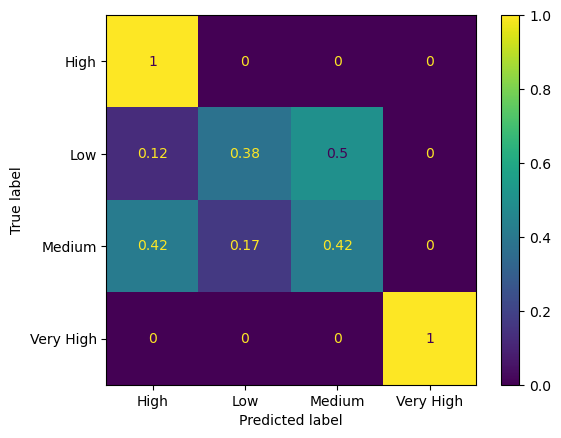

In [113]:
accuracy = accuracy_score(y_test, y_pred)
print(f'SVC Test Accuracy: {accuracy}')

precision = precision_score(y_test, y_pred, labels=model.classes_, average="weighted")
print(f'SVC Test Precision: {precision }')


f1 = f1_score(y_test, y_pred, labels=model.classes_, average="weighted")
print(f'SVC Test F1_score: {f1}')


cm=confusion_matrix(y_test, y_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [114]:
all_pred = best_SCV.predict(df_features_norm)

In [115]:
all_pred

array(['Low', 'Low', 'Low', 'Low', 'High', 'High', 'High', 'High', 'High',
       'High', 'Medium', 'Low', 'Medium', 'Medium', 'Medium', 'Medium',
       'Medium', 'Medium', 'High', 'High', 'Very High', 'Very High',
       'Very High', 'Very High', 'Very High', 'Very High', 'High', 'High',
       'Low', 'High', 'Medium', 'Medium', 'Medium', 'Medium', 'Low',
       'High', 'Low', 'Low', 'Low', 'High', 'Medium', 'Medium', 'High',
       'Medium', 'Low', 'Low', 'Medium', 'Medium', 'Medium', 'Low',
       'High', 'Medium', 'Low', 'Low', 'Low', 'Low', 'Low', 'Medium',
       'Medium', 'Medium', 'Medium', 'Medium', 'Medium', 'Medium',
       'Medium', 'High', 'Very High', 'Medium', 'High', 'Low', 'Medium',
       'Medium', 'Medium'], dtype=object)

In [116]:
df["svc_clusters"]=all_pred

In [117]:
plot_map("svc_clusters", "SVC Clusters")

### Results:

The Support Vector Machine method gave some good results. We can see it was able to classify all of the "Very High" and "High" income neighbors and most of the "Low" and "Medium" Income neighbors. However it did not perform as well as the best decison tree.

## Exercise 7:

S'identifica quines possibles limitacions tenen les dades que has seleccionat per obtenir conclusions amb els models (supervisat i no supervisat)
S'identifiquen possibles riscos de fer servir el model (mínim 300 paraules).

### Conclusions
The limitations of this study have been already mentioned in the previous sections. To highlight again a few: The supervised methods had very few samples on the test dataset because our dataset consists of only 73 entries, and needing the majority for training, we are left with veery few for the test. This makes it more difficult to get good metrics, because chance has a higher impact.

Moreover, the data chosen is not a comprehensive collection of a neighborhood features, but more a few parameters that were found and were accessible online. Other parameters might be more interesting to include in the future, could be life expectancy, different pollutant levels, number of schools, access to public transport, or other economics features like real state prices.

Another limitation we have seen is the normalization of data by neighborhood population. This might affect many features in a dramatic way for neighborhoods that have very high or very low population. Should an extreme (low or high) density be counted as one feature to define a neighborhood, or does it define many of its features? Like access to green spaces, pharmacies, etc. In the current study we have considered that it affects many, but it would be interesting to see how the results change if the data is not normalised to density.

We shall not forget that often it is important to remove outliers. In our case we suspect that the neighborhood La Marina del prat vermell might be considered one, and could be discarded from the analysis. Again it woudl be interesting to redo the models without it. Specially for the cases were we limited our models to predict 4 groups and one group alone was given to it.

One limitation of our study was that we tried to predict a variable that was somewhat arbitrarly chosen. There is no meaningfull categorization of Barcelona neighborhoods into "Very High", "High", "Medium" and "Lower" income, or not at the boundaries that we defined, based solely on the "median average income". In hindsight, maybe it would have been more interesting to predict the District classes than the categorized income, but the code is very modular and can be easily reused to answer other questions.

Overall we saw that the supervised methods had higher accuracy and precision, making them a preferred model for our study. But we need not to forget that these models need labeled data, which in some cases might not be a given.

For these models there are no major risks at making predictions, since the predictions will not have a major impact in the city. However, some neighborhoods might be stigmatized if they are labeled, or wrongly labeled as Low income. Some other neighbours that might be wrongly assigned to be better off, might be left with less attention from the authorities and might suffer from a lack of intervention if their problems are overlooked.